# YOLOv8 OBB and YOLOv8 for Instance Segmentation

Oriented object detection goes a step further than object detection and introduces an extra angle to more accurately locate objects in an image.

The output of an oriented object detector is a set of rotated bounding boxes that precisely enclose the objects in the image, along with class labels and confidence scores for each box. Object detection is a good choice when you need to identify objects of interest in a scene, but you don’t need to know exactly where the object is or its exact shape.

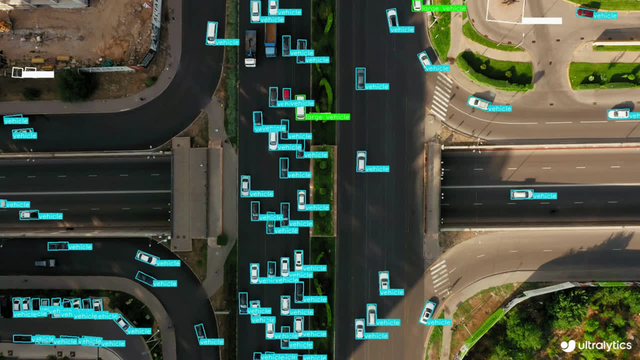

## Overview of OBB (Oriented Bounding Box) Datasets

Training an accurate oriented bounding box (OBB) object detection model requires a comprehensive dataset. This guide explains the various OBB dataset formats supported by Ultralytics YOLO models, providing information on their structure, application, and format conversion methods.

## Supported OBB dataset formats

YOLO OBB Format

The YOLO OBB format designates bounding boxes by their four corner points with normalized coordinates between 0 and 1. It follows this format:

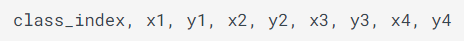

Internally, YOLO processes the losses and outputs the xywhr which represents the center point (xy), width, height and rotation of the bounding box.

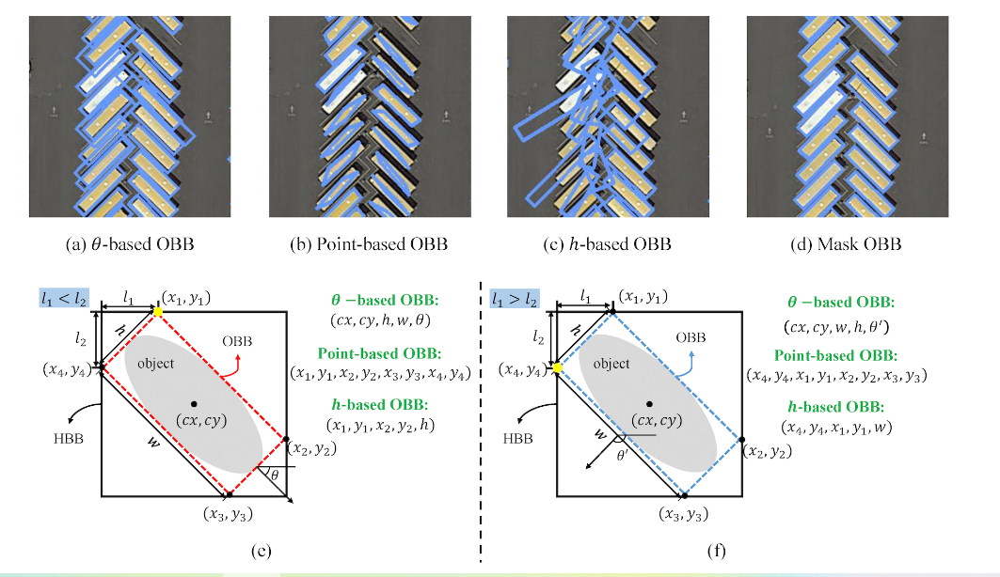

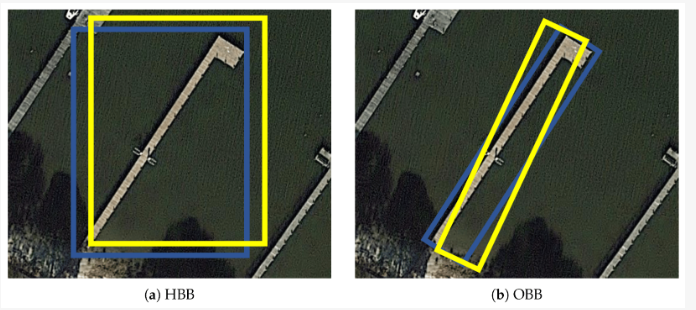

An example of a *.txt for the image above, which contains a class 0 object in OBB format, might look like this:

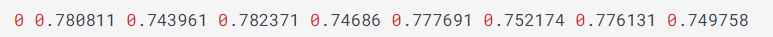

##Models

YOLOv8 pre-trained OBB models are shown here, which are pre-trained on the DOTAv1 dataset.

The models are automatically downloaded from the latest version of Ultralytics on first use.

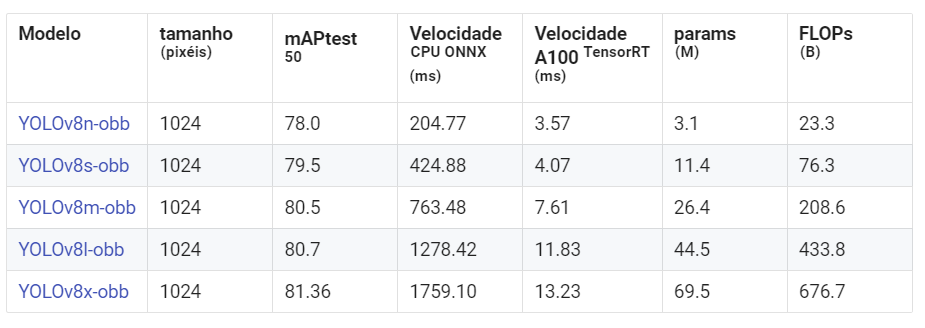

## Supported Datasets

The following oriented bounding box datasets are currently supported:

- DOTA v2: DOTA (A Large-scale Dataset for Object Detection in Aerial Images) version 2 emphasizes detection from aerial perspectives and contains oriented bounding boxes with 1.7 million instances and 11,268 images.

- DOTA8: A small subset of 8 images from the full DOTA dataset suitable for testing continuous integration (CI) workflows and verifications of OBB training in the ultralytics repository.

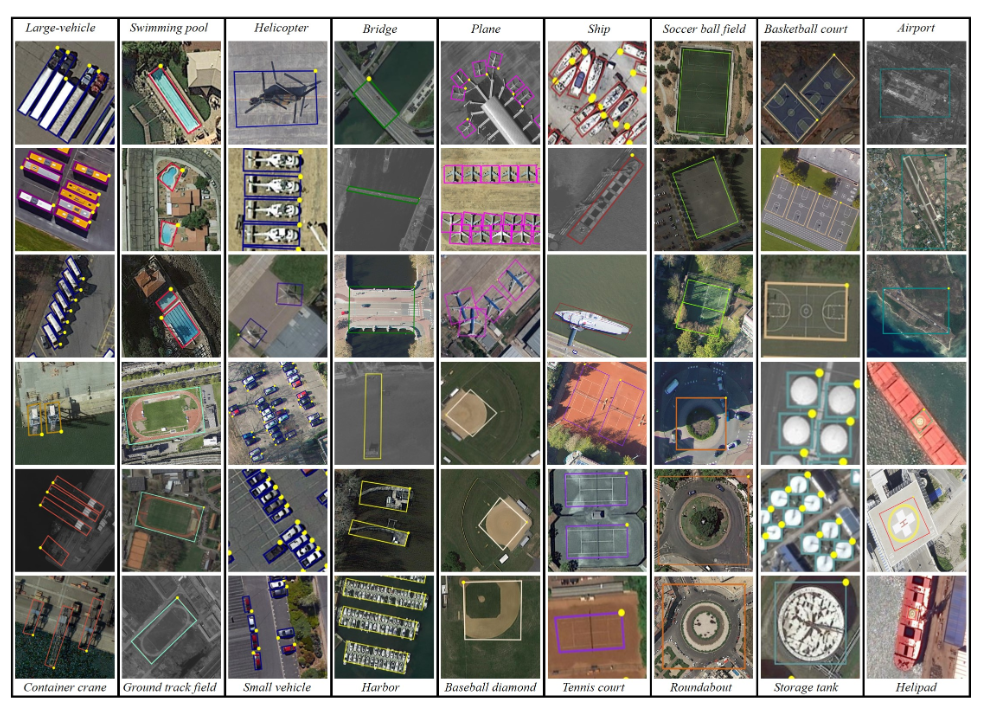

We start by installing the necessary libraries:

In [ ]:
!pip install rasterio
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 35.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 709.5/709.5 kB 2.4 MB/s eta 0:00:00


Now, let's connect to Drive and import the functions we're going to use:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import rasterio
import geopandas as gpd
import numpy as np
from matplotlib import pyplot as plt
import cv2
from rasterio.features import rasterize
from rasterio.windows import Window
from rasterio.plot import show
import os
from shapely.geometry import box
from shapely.ops import unary_union
import json
from shapely.geometry import shape
from shapely.geometry import Polygon
from shapely.geometry import MultiPolygon
from shapely.ops import unary_union
import shapely
import math
import pandas as pd
from skimage import io
from skimage.io import imsave
from sklearn import model_selection
import os
import shutil
import json
import ast
import numpy as np
from tqdm import tqdm
import pandas as  pd
import seaborn as sns
import fastai.vision as vision
import xml.etree.ElementTree as ET
import glob
from shapely.geometry import Polygon

The next step is to set the image path, open it with rasterio and plot it:

In [ ]:
path_img = '/content/drive/MyDrive/Datasets/TL_UAV_Mosaic/Lagoa1.tif'

In [ ]:
src_img = rasterio.open(path_img)

In [ ]:
img = src_img.read()

In [ ]:
img.shape

(4, 24885, 27011)

In [ ]:
img = img.transpose([1,2,0])

(-0.5, 27010.5, 24884.5, -0.5)

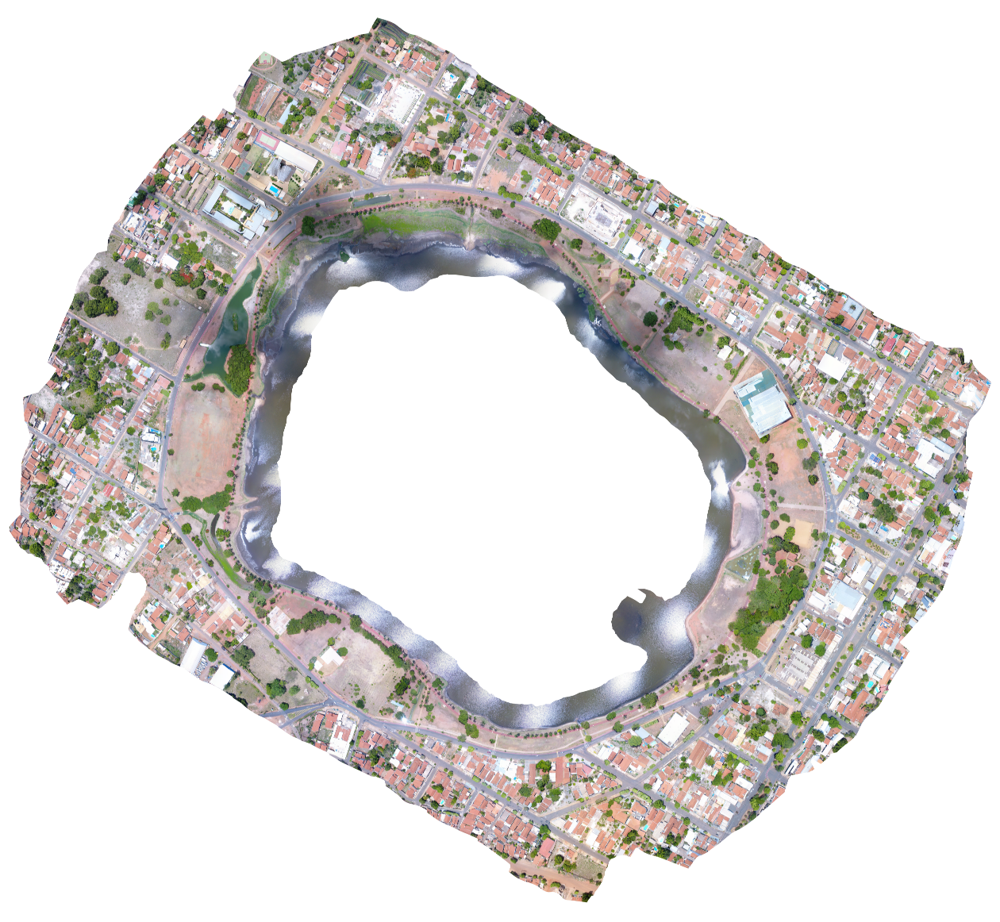

In [ ]:
plt.figure(figsize=[16,16])
plt.imshow(img)
plt.axis('off')

Let's split the image into several image patches with a size of 1024 x 1024:

In [ ]:
if not os.path.isdir('/content/Predict'):
    os.mkdir('/content/Predict')

In [ ]:
qtd = 0
out_meta = src_img.meta.copy()
for n in range((src_img.meta['width']//1024)):
  for m in range((src_img.meta['height']//1024)):
    x = (n*1024)
    y = (m*1024)
    window = Window(x,y,1024,1024)
    win_transform = src_img.window_transform(window)
    arr_win = src_img.read(window=window)
    arr_win = arr_win[0:3,:,:]
    if (arr_win.max() != 0) and (arr_win.shape[1] == 1024) and (arr_win.shape[2] == 1024):
      qtd = qtd + 1
      path_exp = '/content/Predict/img_' + str(qtd) + '.tif'
      out_meta.update({"driver": "GTiff","height": 1024,"width": 1024, "transform":win_transform})
      with rasterio.open(path_exp, 'w', **out_meta) as dst:
          for i, layer in enumerate(arr_win, start=1):
              dst.write_band(i, layer.reshape(-1, layer.shape[-1]))
      del arr_win

In [ ]:
print(qtd)

624


Then we convert the tiff image to jpg:

In [ ]:
if not os.path.isdir('/content/Predict_jpg'):
    os.mkdir('/content/Predict_jpg')

path_data_pred = '/content/Predict_jpg'
imgs_to_pred = os.listdir('/content/Predict')
for images in imgs_to_pred:
  src = rasterio.open('/content/Predict/' + images)
  raster = src.read()
  raster = raster.transpose([1,2,0])
  raster = raster[:,:,0:3]
  imsave(os.path.join(path_data_pred,images.split('.')[0] + '.jpg'), raster)

<ipython-input-14-448461b5bf97>:11: UserWarning: /content/Predict_jpg/img_313.jpg is a low contrast image
  imsave(os.path.join(path_data_pred,images.split('.')[0] + '.jpg'), raster)
<ipython-input-14-448461b5bf97>:11: UserWarning: /content/Predict_jpg/img_205.jpg is a low contrast image
  imsave(os.path.join(path_data_pred,images.split('.')[0] + '.jpg'), raster)
<ipython-input-14-448461b5bf97>:11: UserWarning: /content/Predict_jpg/img_168.jpg is a low contrast image
  imsave(os.path.join(path_data_pred,images.split('.')[0] + '.jpg'), raster)
<ipython-input-14-448461b5bf97>:11: UserWarning: /content/Predict_jpg/img_607.jpg is a low contrast image
  imsave(os.path.join(path_data_pred,images.split('.')[0] + '.jpg'), raster)
<ipython-input-14-448461b5bf97>:11: UserWarning: /content/Predict_jpg/img_216.jpg is a low contrast image
  imsave(os.path.join(path_data_pred,images.split('.')[0] + '.jpg'), raster)
<ipython-input-14-448461b5bf97>:11: UserWarning: /content/Predict_jpg/img_254.jpg is 

Let's import YOLO and use the pre-trained weights from the YOLOv8 OBB:

In [ ]:
from ultralytics import YOLO

In [ ]:
model = YOLO('/content/drive/MyDrive/Datasets/TL_UAV_Mosaic/yolov8x-obb.pt')

In [ ]:
model.predict('/content/Predict_jpg', save=True,save_txt=True, show_conf=False, show_labels=False, imgsz=1024, conf=0.4)


image 1/624 /content/Predict_jpg/img_1.jpg: 1024x1024 (no detections), 16948.1ms
image 2/624 /content/Predict_jpg/img_10.jpg: 1024x1024 (no detections), 11912.8ms
image 3/624 /content/Predict_jpg/img_100.jpg: 1024x1024 (no detections), 14892.3ms
image 4/624 /content/Predict_jpg/img_101.jpg: 1024x1024 (no detections), 12698.2ms
image 5/624 /content/Predict_jpg/img_102.jpg: 1024x1024 12150.1ms
image 6/624 /content/Predict_jpg/img_103.jpg: 1024x1024 12237.4ms
image 7/624 /content/Predict_jpg/img_104.jpg: 1024x1024 (no detections), 11044.8ms
image 8/624 /content/Predict_jpg/img_105.jpg: 1024x1024 (no detections), 12037.0ms
image 9/624 /content/Predict_jpg/img_106.jpg: 1024x1024 (no detections), 13253.3ms
image 10/624 /content/Predict_jpg/img_107.jpg: 1024x1024 (no detections), 12750.9ms
image 11/624 /content/Predict_jpg/img_108.jpg: 1024x1024 12329.1ms
image 12/624 /content/Predict_jpg/img_109.jpg: 1024x1024 (no detections), 11940.9ms
image 13/624 /content/Predict_jpg/img_11.jpg: 1024x102

[ultralytics.engine.results.Results object with attributes:
 
 boxes: None
 keypoints: None
 masks: None
 names: {0: 'plane', 1: 'ship', 2: 'storage tank', 3: 'baseball diamond', 4: 'tennis court', 5: 'basketball court', 6: 'ground track field', 7: 'harbor', 8: 'bridge', 9: 'large vehicle', 10: 'small vehicle', 11: 'helicopter', 12: 'roundabout', 13: 'soccer ball field', 14: 'swimming pool'}
 obb: ultralytics.engine.results.OBB object
 orig_img: array([[[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        ...,
 
        [[255, 25

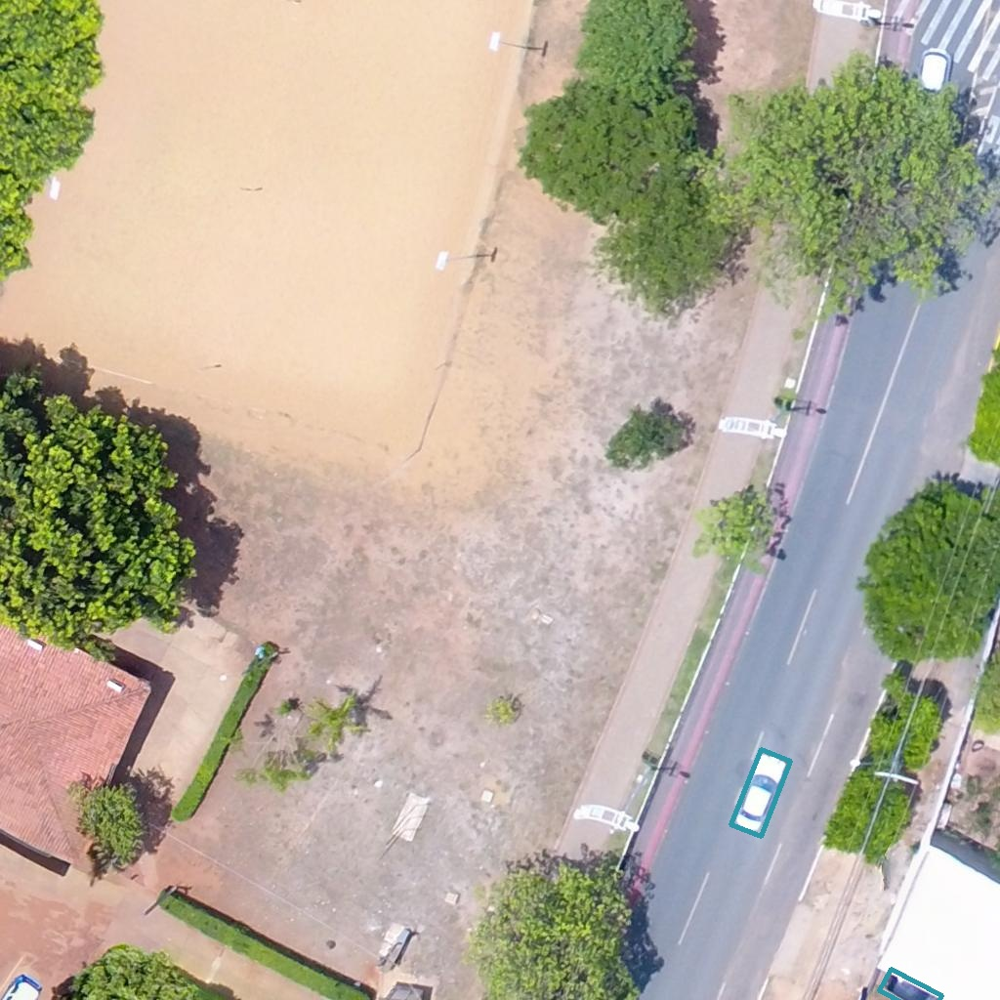

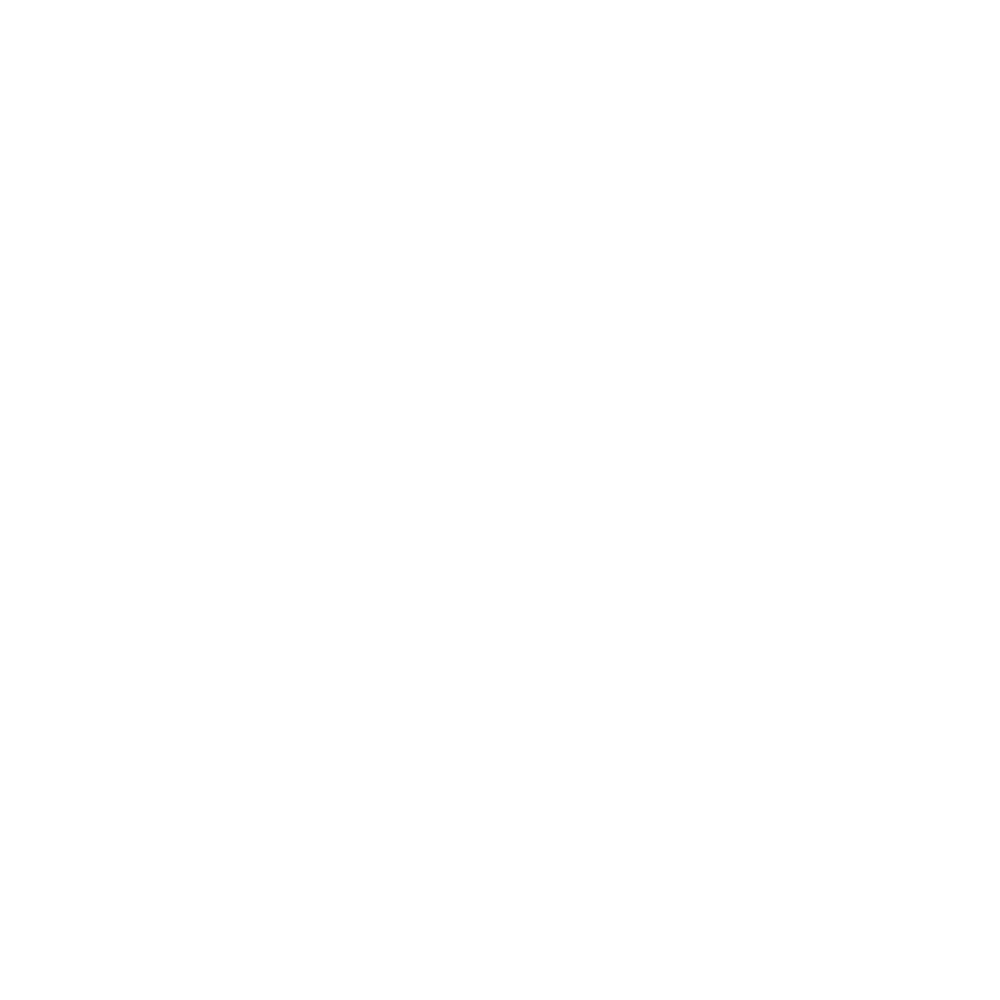

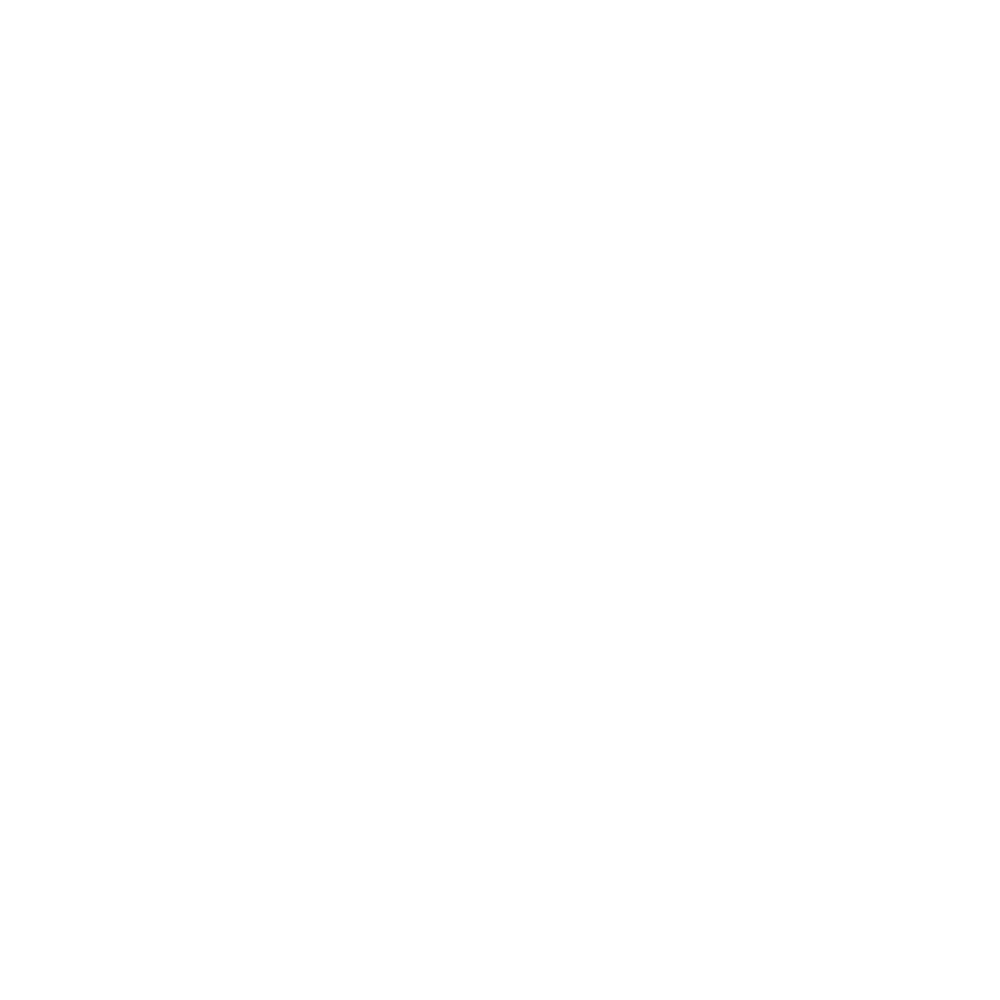

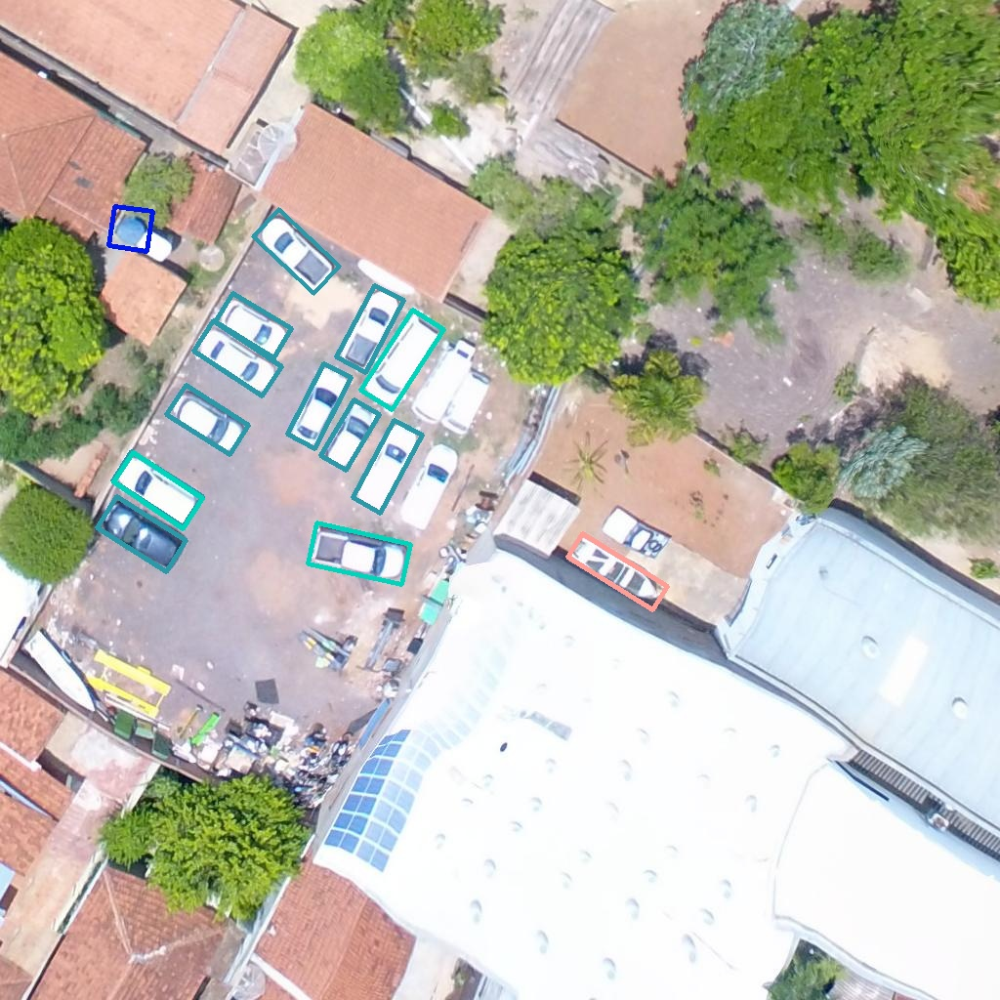

In [ ]:
from IPython.display import Image, display
for images in glob.glob('/content/runs/obb/predict/*.jpg')[316:320]:
    display(Image(filename=images))

With the generated results, we will obtain the coordinates of the bounding boxes and convert them into a polygon with geographic coordinates:

In [ ]:
ls_poly = []
ls_class = []
imgs_to_pred = [f for f in os.listdir('/content/runs/obb/predict/labels/') if f.endswith('.txt')]
for images in imgs_to_pred:
  filename = images.split('.')[0]
  src = rasterio.open('/content/Predict/' + filename + '.tif')
  path = f'/content/runs/obb/predict/labels/'+filename+'.txt'
  cols = ['class', 'x1', 'y1', 'x2', 'y2', 'x3', 'y3', 'x4', 'y4']
  df = pd.read_csv(path, sep=" ", header=None)
  df.columns = cols
  df['x1'] = np.round(df['x1'] * 1024)
  df['y1'] = np.round(df['y1'] * 1024)
  df['x2'] = np.round(df['x2'] * 1024)
  df['y2'] = np.round(df['y2'] * 1024)
  df['x3'] = np.round(df['x3'] * 1024)
  df['y3'] = np.round(df['y3'] * 1024)
  df['x4'] = np.round(df['x4'] * 1024)
  df['y4'] = np.round(df['y4'] * 1024)

  for i,row in df.iterrows():
    xs1, ys1 = rasterio.transform.xy(src.transform, row['y1'], row['x1'])
    xs2, ys2 = rasterio.transform.xy(src.transform, row['y2'], row['x2'])
    xs3, ys3 = rasterio.transform.xy(src.transform, row['y3'], row['x3'])
    xs4, ys4 = rasterio.transform.xy(src.transform, row['y4'], row['x4'])

    ls_poly.append(Polygon([[xs1, ys1], [xs2,ys2], [xs3, ys3], [xs4,ys4]]))
    ls_class.append(row['class'])


Then we create a GeoDataFrame with the polygons:

In [ ]:
gdf = gpd.GeoDataFrame(ls_class, geometry=ls_poly, crs=src.crs)

In [ ]:
gdf.rename(columns={0:'class'}, inplace=True)

In [ ]:
gdf

,class,geometry
0,11.0,"POLYGON ((-51.71160 -20.78338, -51.71160 -20.7..."
1,9.0,"POLYGON ((-51.71505 -20.78658, -51.71504 -20.7..."
2,10.0,"POLYGON ((-51.71170 -20.78445, -51.71168 -20.7..."
3,10.0,"POLYGON ((-51.71138 -20.78416, -51.71137 -20.7..."
4,1.0,"POLYGON ((-51.71185 -20.78462, -51.71184 -20.7..."
...,...,...
348,14.0,"POLYGON ((-51.71353 -20.77929, -51.71351 -20.7..."
349,10.0,"POLYGON ((-51.71566 -20.77914, -51.71565 -20.7..."
350,9.0,"POLYGON ((-51.71553 -20.77928, -51.71552 -20.7..."
351,10.0,"POLYGON ((-51.71133 -20.78359, -51.71132 -20.7..."


Finally we can save it in a .shp or .json:

In [ ]:
gdf.to_file('objects.json')

We open the file in QGIS to see the results along with the image:

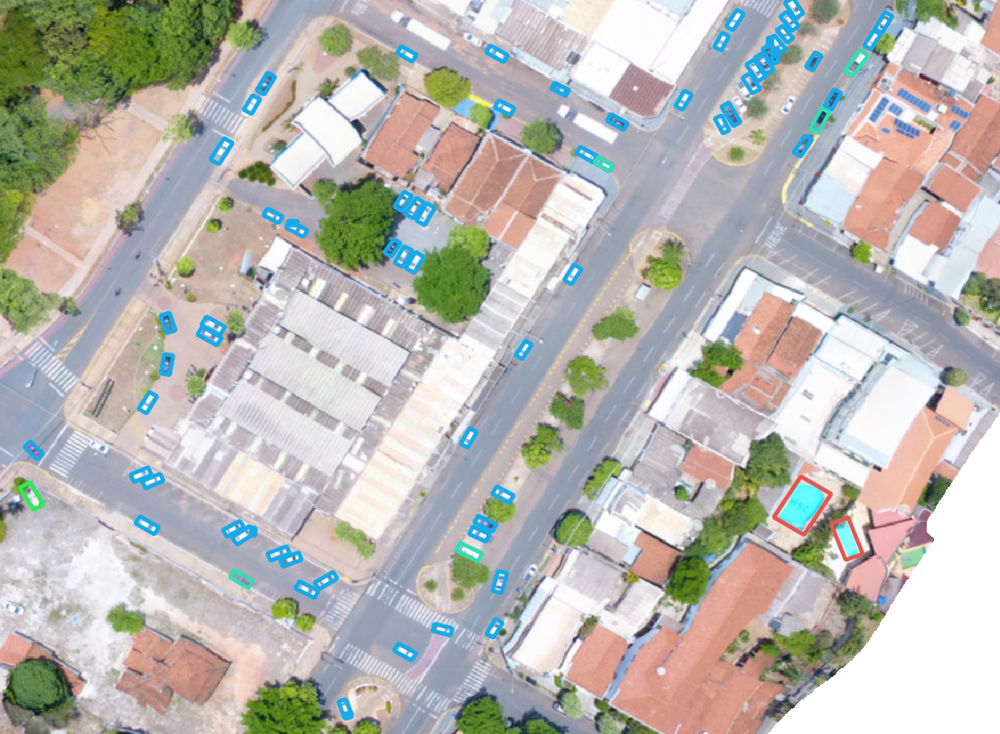

## Instance segmentation

Instance segmentation is a computer vision task that involves identifying and delineating individual objects in an image. Unlike semantic segmentation, which classifies each pixel into predefined categories, instance segmentation aims to differentiate and separate object instances from one another.

In instance segmentation, the goal is not only to classify each pixel, but also to assign a unique label or identifier to each distinct object instance. This means that objects of the same class are treated as separate entities. For example, if there are multiple instances of cars in an image, instance segmentation algorithms will assign a unique label to each car, allowing for accurate identification and differentiation.

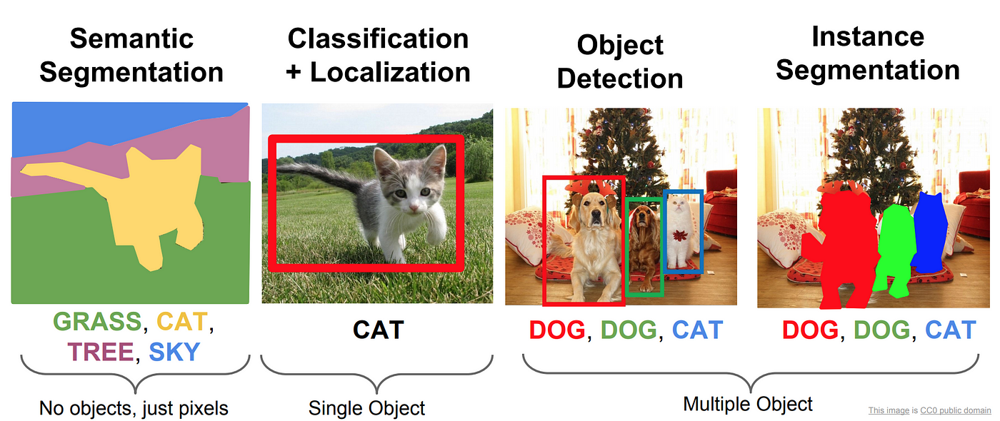

## Why use YOLOv8 instance segmentation?

YOLOv8 is a state-of-the-art object detection algorithm known for its high accuracy and real-time performance. It is particularly effective when it comes to instance segmentation, which involves identifying and outlining individual objects in an image. YOLOv8 provides accurate bounding boxes and masks, making it an excellent choice for tasks that require pixel-level analysis.

## Segmenting orange trees with YOLOv8

Let's start by installing rasterio and importing the necessary libraries:

In [ ]:
!pip install rasterio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 34.1 MB/s eta 0:00:00


In [ ]:
import rasterio
import geopandas as gpd
import numpy as np
from matplotlib import pyplot as plt
import cv2
from rasterio.features import rasterize
from rasterio.windows import Window
import os
from shapely.geometry import box
import pandas as pd
from skimage.io import imsave
from sklearn import model_selection
import os
import shutil
import json
import ast
import numpy as np
from tqdm import tqdm
import pandas as  pd
import seaborn as sns
import fastai.vision as vision
import glob
from shapely.geometry import Polygon

Now we connect the Drive and set the paths of the files that will be used:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path_img = '/content/drive/MyDrive/Datasets/orange_trees/Orange_trees.tif'
path_shp = '/content/drive/MyDrive/Datasets/orange_trees/orange_trees.shp'

We can open the image and use matplotlib to visualize it:

In [ ]:
label = gpd.read_file(path_shp)

In [ ]:
src = rasterio.open(path_img)

In [ ]:
img = src.read()

In [ ]:
img.shape

(3, 5106, 15360)

In [ ]:
img = img.transpose([1,2,0])

(-0.5, 15359.5, 5105.5, -0.5)

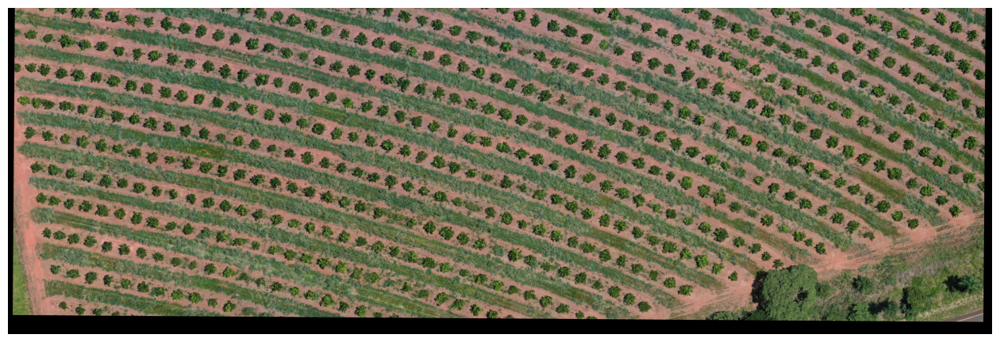

In [ ]:
plt.figure(figsize=[16,16])
plt.imshow(img)
plt.axis('off')

Let's divide the image into 1024x1024 patches:

In [ ]:
qtd = 0
out_meta = src.meta.copy()
for n in range((src.meta['width']//1024)):
  for m in range((src.meta['height']//1024)):
    x = (512+(n*1024))
    y = (512+(m*1024))
    window = Window(x,y,1024,1024)
    win_transform = src.window_transform(window)
    arr_win = src.read(window=window)
    arr_win = arr_win[0:3,:,:]
    qtd = qtd + 1
    path_exp = '/content/drive/MyDrive/Datasets/orange_trees/data/img_' + str(qtd) + '.tif'
    out_meta.update({"driver": "GTiff","height": 1024,"width": 1024, "transform":win_transform})
    with rasterio.open(path_exp, 'w', **out_meta) as dst:
        for i, layer in enumerate(arr_win, start=1):
            dst.write_band(i, layer.reshape(-1, layer.shape[-1]))
    del arr_win

In [ ]:
path_data = '/content/drive/MyDrive/Datasets/orange_trees/data/'

In [ ]:
images_files = [f for f in os.listdir(path_data)]

Let's split the training and testing images:

In [ ]:
images_files_train, images_files_valid= model_selection.train_test_split(
    images_files,
    test_size=0.1,
    random_state=42,
    shuffle=True,
)
print(len(images_files_train))
print(len(images_files_valid))

54
6


We will get jpg versions of the .tiff images to feed to YOLO

In [ ]:
destination_1 = 'train'
destination_2 = 'validation'

if not os.path.isdir(destination_1):
    os.mkdir(destination_1)
if not os.path.isdir(destination_2):
    os.mkdir(destination_2)

In [ ]:
path_data_new = '/content/train'
for images in images_files_train:
  src = rasterio.open(os.path.join(path_data,images))
  raster = src.read()
  raster = raster.transpose([1,2,0])
  imsave(os.path.join(path_data_new,images.split('.')[0] + '.jpg'), raster)

In [ ]:
path_data_new = '/content/validation'
for images in images_files_valid:
  src = rasterio.open(os.path.join(path_data,images))
  raster = src.read()
  raster = raster.transpose([1,2,0])
  imsave(os.path.join(path_data_new,images.split('.')[0] + '.jpg'), raster)

Now let's work with Labels. First we check if the image and the vector have the same coordinate system:

In [ ]:
src.crs

CRS.from_epsg(31982)

In [ ]:
label = label.to_crs(src.crs)

In [ ]:
label.crs

<Projected CRS: EPSG:31982>
Name: SIRGAS 2000 / UTM zone 22S
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: UTM zone 22S
- method: Transverse Mercator
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

Let's plot the labels:

<Axes: >

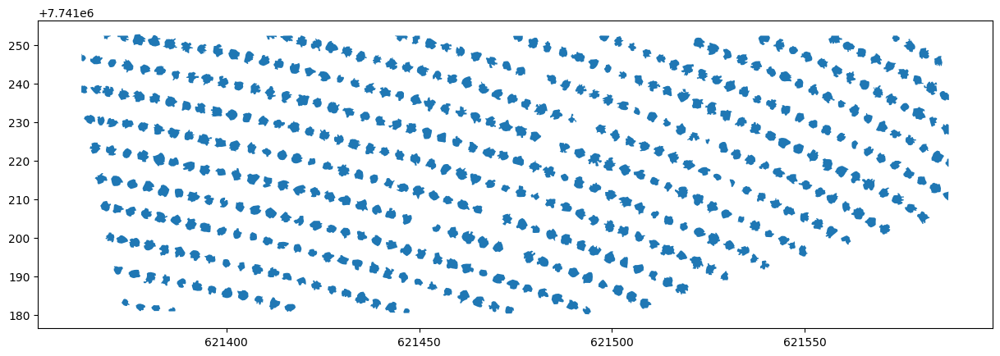

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(15, 15))
label.plot(ax = ax)

Now let's create the training and validation datasets with the polygons that intersect each of the images:

In [ ]:
poly_geometry_train = []
img_id_train = []
for fp1 in images_files_train:
  src1 = rasterio.open(os.path.join(path_data,fp1))
  bounds1  = src1.bounds
  df1 = gpd.GeoDataFrame({"id":1,"geometry":[box(*bounds1)]})
  df1 = df1.set_crs(epsg=31982)

  for i,row in label.iterrows():
    intersects = df1['geometry'][0].intersection(row['geometry'])
    if (intersects.is_empty == False):
      poly_geometry_train.append(intersects)
      img_id_train.append(fp1)

In [ ]:
poly_geometry_val = []
img_id_val = []
for fp2 in images_files_valid:
  src2 = rasterio.open(os.path.join(path_data,fp2))
  bounds2  = src2.bounds
  df2 = gpd.GeoDataFrame({"id":1,"geometry":[box(*bounds2)]})
  df2 = df2.set_crs(epsg=31982)

  for i,row in label.iterrows():
    intersects = df2['geometry'][0].intersection(row['geometry'])
    if (intersects.is_empty == False):
      poly_geometry_val.append(intersects)
      img_id_val.append(fp2)

In [ ]:
dataset_train = gpd.GeoDataFrame(geometry=poly_geometry_train)
dataset_val = gpd.GeoDataFrame(geometry=poly_geometry_val)

In [ ]:
dataset_train['ImageId'] = img_id_train
dataset_val['ImageId'] = img_id_val

So we have the dataframe with the geometry of the polygon and the id of the image to which it belongs:

In [ ]:
dataset_val

,geometry,ImageId
0,"POLYGON ((621429.317 7741234.534, 621429.441 7...",img_17.tif
1,"POLYGON ((621431.886 7741231.723, 621431.776 7...",img_17.tif
2,"POLYGON ((621436.050 7741230.603, 621435.668 7...",img_17.tif
3,"POLYGON ((621438.937 7741229.644, 621438.970 7...",img_17.tif
4,"POLYGON ((621444.528 7741229.644, 621443.032 7...",img_17.tif
...,...,...
58,"POLYGON ((621406.293 7741224.685, 621406.554 7...",img_10.tif
59,"POLYGON ((621409.384 7741222.229, 621409.156 7...",img_10.tif
60,"POLYGON ((621414.105 7741220.207, 621413.972 7...",img_10.tif
61,"POLYGON ((621410.568 7741229.644, 621410.482 7...",img_10.tif


The next step is to convert the coordinates into x and y values.

In [ ]:
df_train = []
Id_train = []
for i,row in dataset_train.iterrows():
  ImageID = row['ImageId'].split('.')[0] + '.jpg'
  src1 = rasterio.open(os.path.join(path_data,row['ImageId']))
  poly = []
  if row.geometry.geom_type == 'Polygon':
    for point in list(row.geometry.exterior.coords):
      x = point[0]
      y = point[1]
      row, col = src1.index(x,y)
      poly.append(col)
      poly.append(row)
    Id_train.append(ImageID)
    df_train.append(poly)


In [ ]:
df_val = []
Id_val = []
for i,row in dataset_val.iterrows():
  ImageID = row['ImageId'].split('.')[0] + '.jpg'
  src2 = rasterio.open(os.path.join(path_data,row['ImageId']))
  poly = []
  if row.geometry.geom_type == 'Polygon':
    for point in list(row.geometry.exterior.coords):
      x = point[0]
      y = point[1]
      row, col = src2.index(x,y)
      poly.append(col)
      poly.append(row)
    Id_val.append(ImageID)
    df_val.append(poly)

In [ ]:
train_set = pd.DataFrame([])
valid_set = pd.DataFrame([])

In [ ]:
train_set['ImageId'] = Id_train
valid_set['ImageId'] = Id_val

In [ ]:
train_set['geometry'] = df_train
valid_set['geometry'] = df_val

Since we only have the orange tree class, let's configure it.

In [ ]:
train_set['class'] = 0
train_set['class_name'] = 'orange_tree'

valid_set['class'] = 0
valid_set['class_name'] = 'orange_tree'

In [ ]:
train_set

,ImageId,geometry,class,class_name
0,img_50.jpg,"[1024, 1023, 966, 1023, 965, 1022, 939, 1008, ...",0,orange_tree
1,img_50.jpg,"[748, 1023, 738, 995, 741, 968, 754, 959, 762,...",0,orange_tree
2,img_50.jpg,"[1024, 571, 1019, 575, 1006, 569, 984, 554, 96...",0,orange_tree
3,img_50.jpg,"[0, 1023, 0, 1014, 7, 1019, 10, 1023, 0, 1023]",0,orange_tree
4,img_50.jpg,"[524, 916, 514, 883, 495, 887, 479, 857, 457, ...",0,orange_tree
...,...,...,...,...
469,img_55.jpg,"[782, 386, 798, 393, 819, 392, 822, 403, 818, ...",0,orange_tree
470,img_55.jpg,"[439, 349, 424, 327, 431, 298, 441, 270, 462, ...",0,orange_tree
471,img_55.jpg,"[219, 254, 225, 227, 207, 218, 199, 208, 201, ...",0,orange_tree
472,img_55.jpg,"[0, 0, 121, 0, 124, 24, 126, 64, 120, 87, 107,...",0,orange_tree


After that we create the .csv files to use in YOLOv5:

In [ ]:
def convert(data, data_type):
    df = data.groupby('ImageId')['geometry'].apply(list).reset_index(name='bboxes')
    df['classes'] = data.groupby('ImageId')['class'].apply(list).reset_index(drop=True)
    df.to_csv(data_type + '.csv', index=False)
    print(data_type)
    print(df.shape)
    print(df.head())

df_train = convert(train_set, '/content/train')
df_valid = convert(valid_set, '/content/validation')

/content/train
(52, 3)
      ImageId                                             bboxes  \
0   img_1.jpg  [[32, 1024, 37, 1014, 58, 947, 77, 931, 99, 92...   
1  img_11.jpg  [[0, 789, 19, 781, 44, 782, 57, 807, 79, 809, ...   
2  img_12.jpg  [[0, 894, 1, 889, 34, 864, 54, 836, 77, 835, 1...   
3  img_13.jpg  [[0, 1024, 0, 968, 0, 968, 11, 990, 16, 1002, ...   
4  img_14.jpg  [[0, 1023, 0, 1006, 25, 997, 46, 991, 98, 1000...   

                                classes  
0     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]  
1  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]  
2        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]  
3     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]  
4        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]  
/content/validation
(6, 3)
      ImageId                                             bboxes  \
0  img_10.jpg  [[0, 787, 17, 785, 51, 817, 62, 878, 59, 899, ...   
1  img_17.jpg  [[0, 694, 8, 699, 0, 708, 0, 694], [172, 884, ...   
2   img_2.jpg  [[0, 922, 27, 935, 44, 993, 29, 1004, 0, 1000,...   
3  img_22.jpg  [[

Now is the time to prepare the environment to use YOLOv8. We will install the Ultralytics library and import YOLO

In [ ]:
!pip install ultralytics

from IPython import display

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.4/225.8 GB disk)


In [ ]:
from ultralytics import YOLO

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


Inside the yolo folder, we create the plant_data folder to store our data.

In [ ]:
!mkdir plant_data
%cd plant_data

/content/plant_data


In [ ]:
!mkdir images
!mkdir labels
%cd images
!mkdir train
!mkdir validation
%cd ..
%cd labels
!mkdir train
!mkdir validation
%cd ..
%cd ..


/content/plant_data/images
/content/plant_data
/content/plant_data/labels
/content/plant_data
/content


Let's copy the images and create a .txt for each image with boundaries inside the folder of our project that we just created:

In [ ]:
INPUT_PATH = '/content/'
OUTPUT_PATH = '/content/plant_data'
def process_data(data, data_type='train'):
    for _, row in tqdm(data.iterrows(), total = len(data)):
        image_name = row['ImageId'].split('.')[0]
        bounding_boxes = row['bboxes']
        classes = row['classes']
        yolo_data = []

        for bbox, Class in zip(bounding_boxes, classes):
            norm_bbox = [x/1024 for x in bbox]
            yolo_data.append([Class]+ norm_bbox)
            lst_fmt = ['%f'] * len(norm_bbox)
            fmt_full = ['%d'] + lst_fmt


        with open(os.path.join(OUTPUT_PATH, f"labels/{data_type}/{image_name}.txt"), "w") as f:
          for row in yolo_data:
              for el in row:
                  f.write("%s" %el + ' ')
              f.write('\n')
          f.close()


        shutil.copyfile(
            os.path.join(INPUT_PATH, f"{data_type}/{image_name}.jpg"),
            os.path.join(OUTPUT_PATH, f"images/{data_type}/{image_name}.jpg")
        )


df_train = pd.read_csv('/content/train.csv')
df_train.bboxes = df_train.bboxes.apply(ast.literal_eval)
df_train.classes = df_train.classes.apply(ast.literal_eval)

df_valid = pd.read_csv('/content/validation.csv')
df_valid.bboxes = df_valid.bboxes.apply(ast.literal_eval)
df_valid.classes = df_valid.classes.apply(ast.literal_eval)

process_data(df_train, data_type='train')
process_data(df_valid, data_type='validation')

100%|██████████| 6/6 [00:00<00:00, 258.42it/s]


Here we can check if the .txt was created correctly:

In [ ]:
f = open('/content/plant_data/labels/train/'+os.listdir("/content/plant_data/labels/train/")[10])
print(f.name)
for l in f:
    print(l)

/content/plant_data/labels/train/img_26.txt
0 0.0 0.78125 0.01171875 0.775390625 0.03515625 0.7607421875 0.0634765625 0.7490234375 0.0712890625 0.7646484375 0.08984375 0.78125 0.1005859375 0.787109375 0.1435546875 0.7568359375 0.150390625 0.7666015625 0.1318359375 0.7919921875 0.1298828125 0.8115234375 0.166015625 0.818359375 0.173828125 0.8564453125 0.1845703125 0.8740234375 0.1513671875 0.8876953125 0.1689453125 0.9072265625 0.1787109375 0.921875 0.150390625 0.9365234375 0.1142578125 0.958984375 0.0712890625 0.9619140625 0.029296875 0.9375 0.01171875 0.90625 0.0 0.888671875 0.0 0.8271484375 0.0068359375 0.8212890625 0.0 0.8173828125 0.0 0.78125 

0 0.25390625 0.9990234375 0.25 0.9892578125 0.2373046875 0.966796875 0.2392578125 0.9453125 0.234375 0.927734375 0.2294921875 0.8994140625 0.2314453125 0.8662109375 0.2490234375 0.853515625 0.2783203125 0.8525390625 0.2861328125 0.8681640625 0.291015625 0.8662109375 0.3076171875 0.859375 0.3408203125 0.8681640625 0.3525390625 0.884765625 0.3

Let's visualize an image and the mask with the instances:

In [ ]:
from typing import Tuple, List
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from time import time
from rich import print

In [ ]:
def read_image_label(path_to_img: str, path_to_txt: str, normalize: bool = False) -> Tuple[np.array, np.array]:

    # read image
    image = cv2.imread(path_to_img)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_h, img_w = image.shape[:2]

    # read .txt file for this image
    with open(path_to_txt, "r") as f:
        txt_file = f.readlines()
        polygon_list = []
        for line in txt_file:
            line_split = line.split()
            cls_idx = line_split[0]
            coords = line_split[1:]
            polygon = np.array([[eval(x), eval(y)] for x, y in zip(coords[0::2], coords[1::2])]) # convert list of coordinates to numpy massive

    # Convert normilized coordinates of polygons to coordinates of image
            if normalize:
                polygon[:,0] = polygon[:,0]*img_w
                polygon[:,1] = polygon[:,1]*img_h
            polygon_list.append(polygon.astype(np.int32))

        return image, polygon_list

def show_image_mask(img: np.array, polygon_list: np.array, alpha: float = 0.7):

    # Create zero array for mask
    mask = np.zeros((img.shape[0], img.shape[1]), dtype=np.uint8)
    overlay = img.copy()

    # Draw polygon on the image and mask
    for polygon in polygon_list:
        cv2.fillPoly(mask, pts=[polygon], color=(255, 255, 255))
        cv2.fillPoly(img, pts=[polygon], color=(255, 0, 0))

    # Plot image with mask
    fig = plt.figure(figsize=(22,18))
    axes = fig.subplots(nrows=1, ncols=2)
    axes[0].imshow(img)
    axes[1].imshow(mask, cmap="Greys_r")
    axes[0].set_title("Imagen original con la máscara")
    axes[1].set_title("Máscara")

    plt.show()

In [ ]:
image, polygon = read_image_label(path_to_img='/content/plant_data/images/train/img_11.jpg',
                                 path_to_txt='/content/plant_data/labels/train/img_11.txt',
                                 normalize=True)

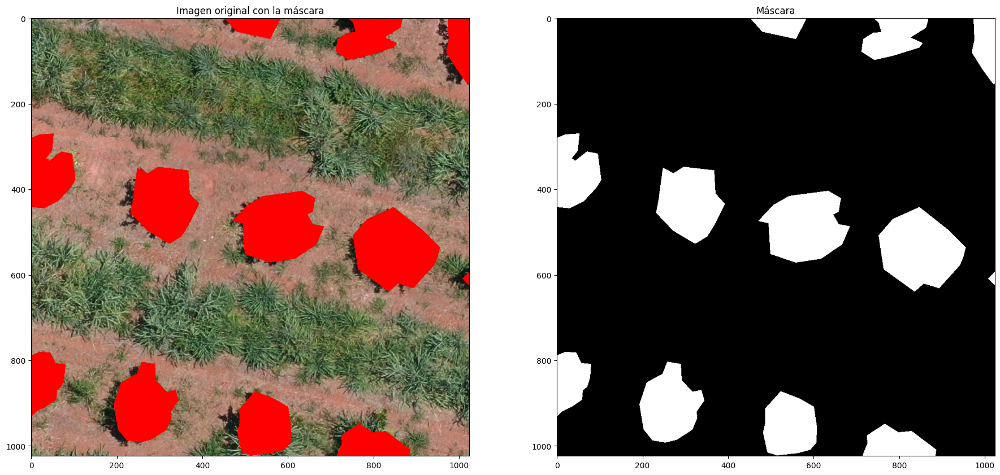

In [ ]:
show_image_mask(img=image, polygon_list=polygon)

Finally, we will create the yaml with our project information and run the train.py file.

In [ ]:
%%writefile orange_tree.yaml

train: /content/plant_data/images/train
val: /content/plant_data/images/validation
nc: 1
names: ['Orange Tree']

Writing orange_tree.yaml


In [ ]:
%cd {HOME}

!yolo task=segment mode=train model=yolov8s-seg.pt data=/content/orange_tree.yaml epochs=25 imgsz=1024

/content
100% 22.8M/22.8M [00:00<00:00, 325MB/s]
Ultralytics YOLOv8.1.9 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=/content/orange_tree.yaml, epochs=25, time=None, patience=50, batch=16, imgsz=1024, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save

After finishing the training, we can observe the statistics:

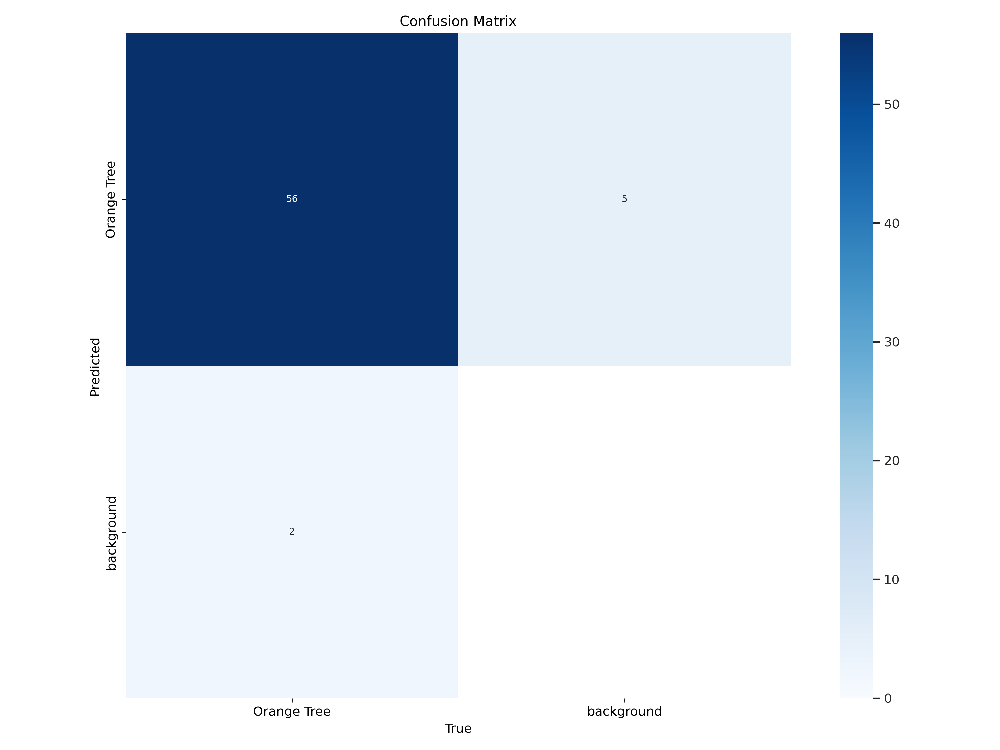

In [ ]:
from IPython.display import display, Image
Image(filename=f'{HOME}/runs/segment/train/confusion_matrix.png', width=600)

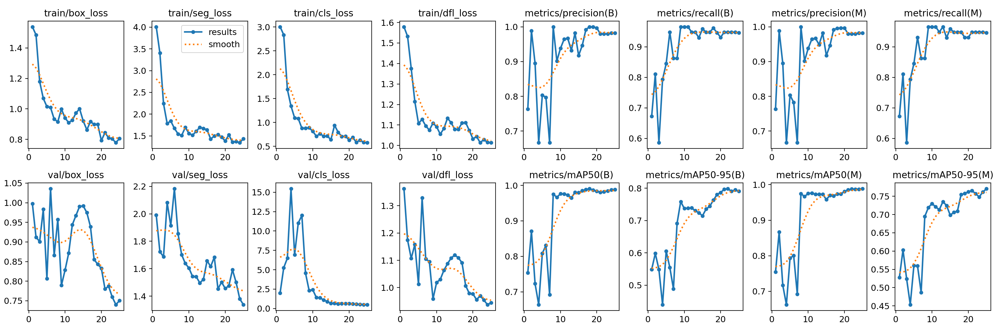

In [ ]:
Image(filename=f'{HOME}/runs/segment/train/results.png', width=600)

So, let's detect orange trees in our validation images:

In [ ]:
!yolo task=segment mode=predict model=/content/runs/segment/train/weights/best.pt conf=0.50 source= /content/plant_data/images/validation save=true save_txt=true

Ultralytics YOLOv8.1.9 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11779987 parameters, 0 gradients, 42.4 GFLOPs

image 1/6 /content/plant_data/images/validation/img_1.jpg: 1024x1024 11 Orange Trees, 43.2ms
image 2/6 /content/plant_data/images/validation/img_14.jpg: 1024x1024 11 Orange Trees, 43.1ms
image 3/6 /content/plant_data/images/validation/img_38.jpg: 1024x1024 11 Orange Trees, 43.1ms
image 4/6 /content/plant_data/images/validation/img_47.jpg: 1024x1024 8 Orange Trees, 42.5ms
image 5/6 /content/plant_data/images/validation/img_55.jpg: 1024x1024 8 Orange Trees, 40.7ms
image 6/6 /content/plant_data/images/validation/img_6.jpg: 1024x1024 8 Orange Trees, 40.7ms
Speed: 3.7ms preprocess, 42.2ms inference, 86.9ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to runs/segment/predict
6 labels saved to runs/segment/predict/labels
💡 Learn more at https://docs.ultralytics.com/modes/predict


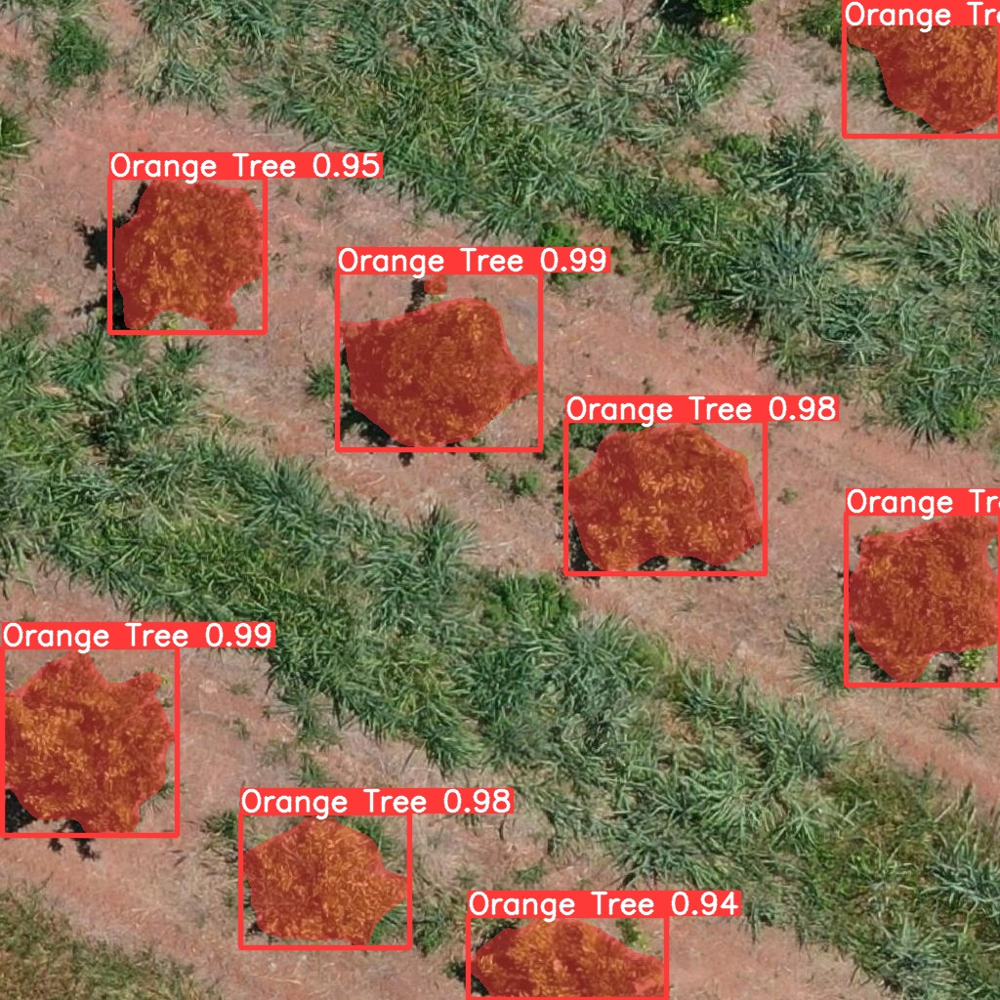

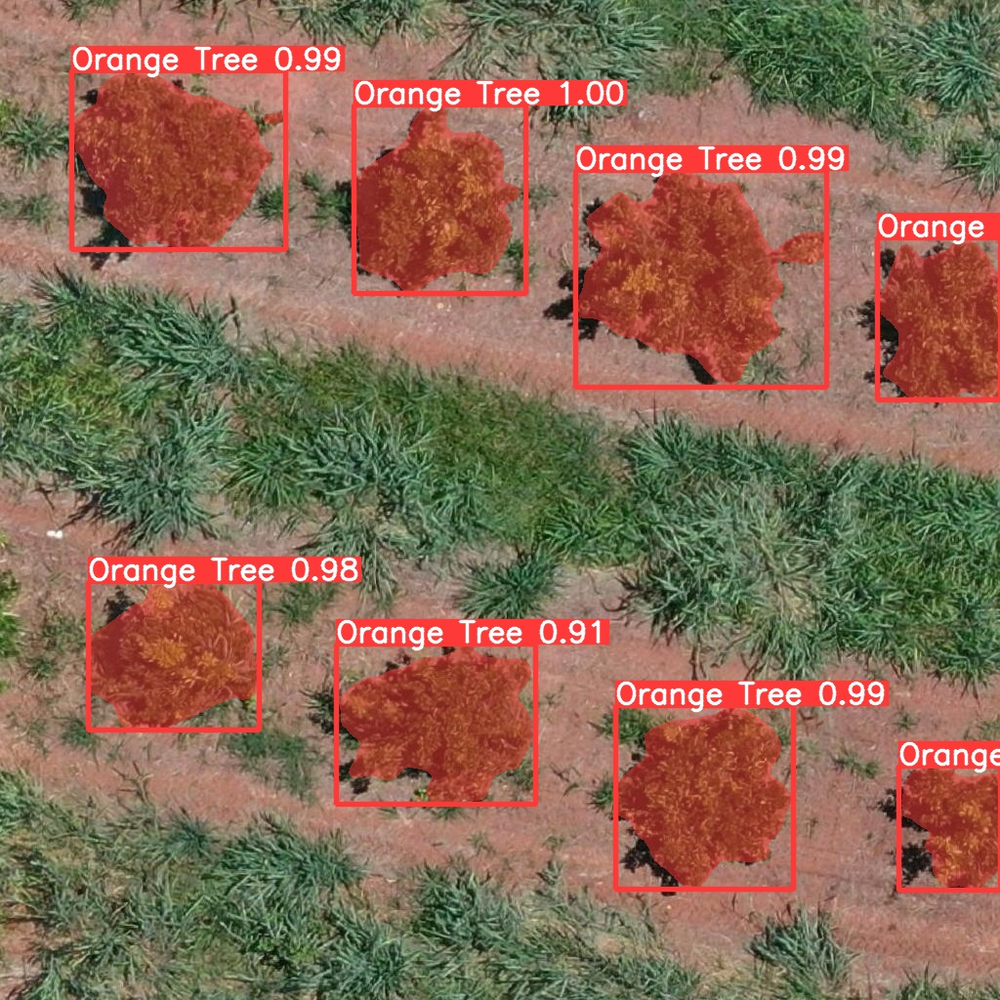

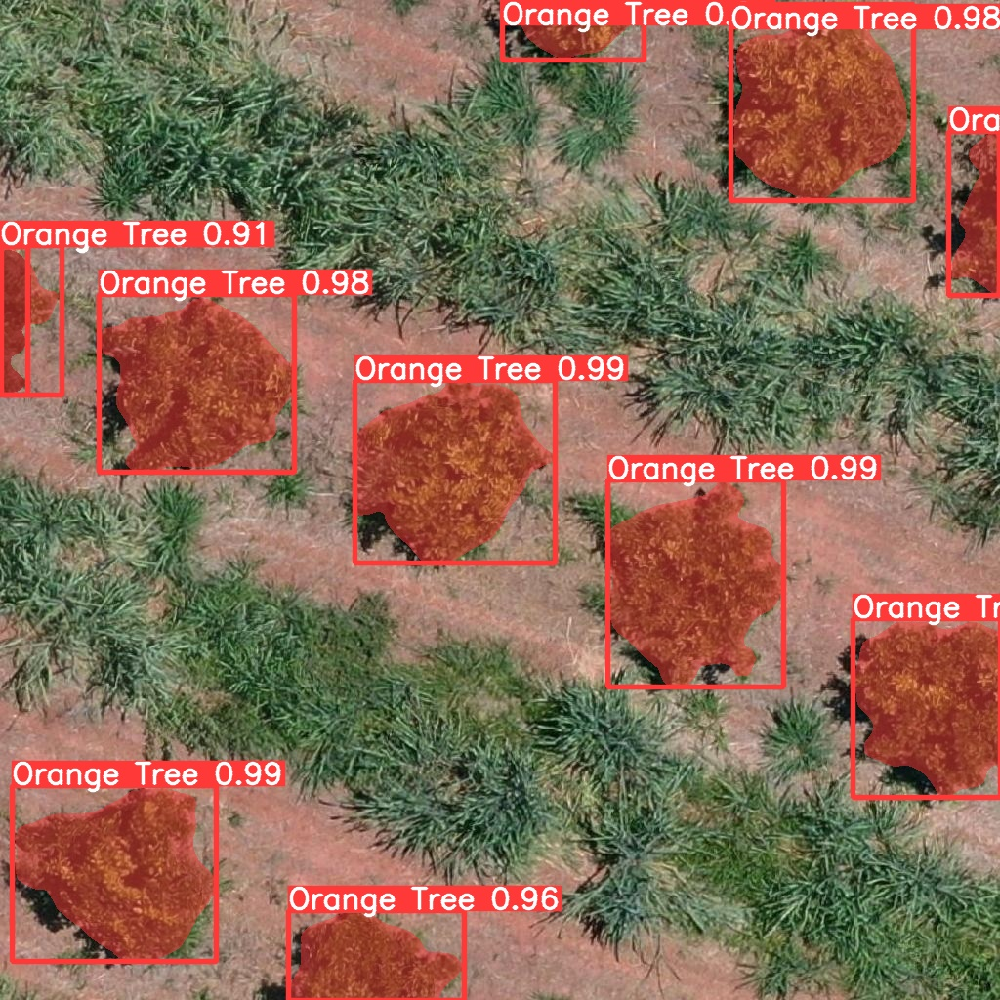

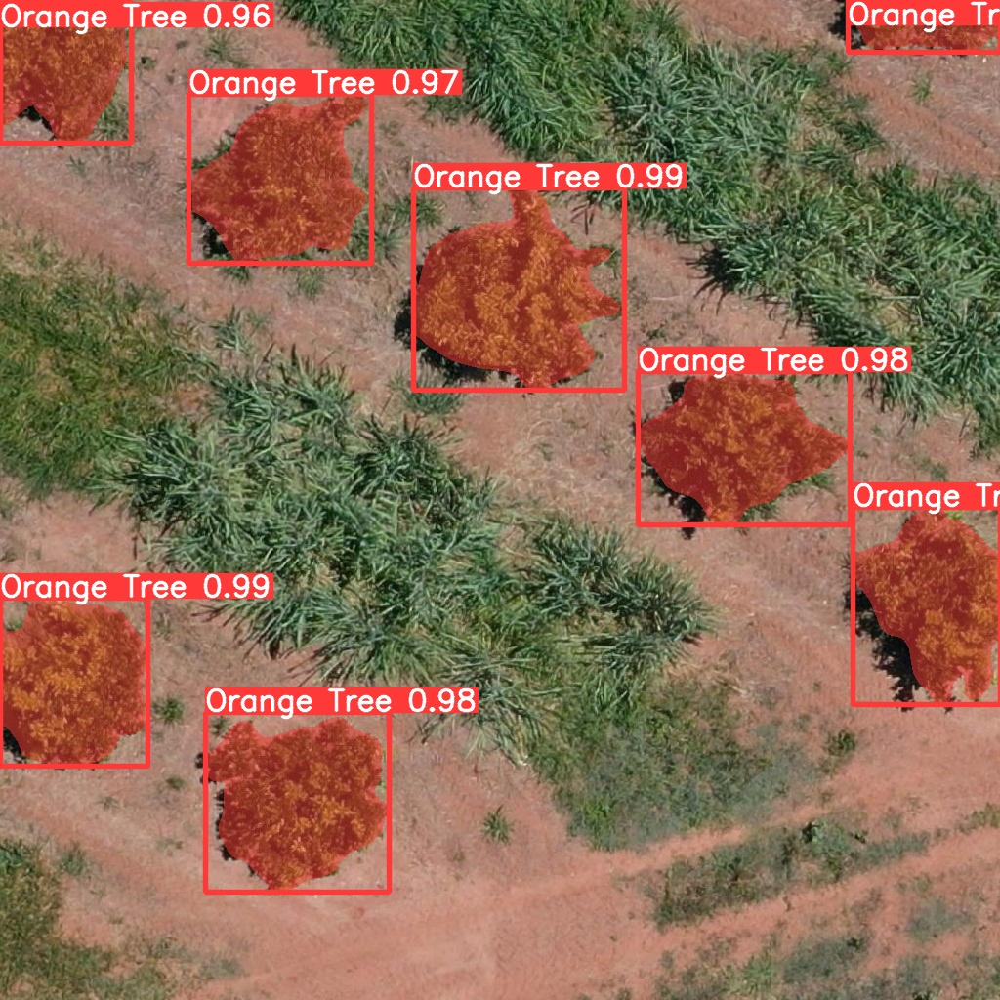

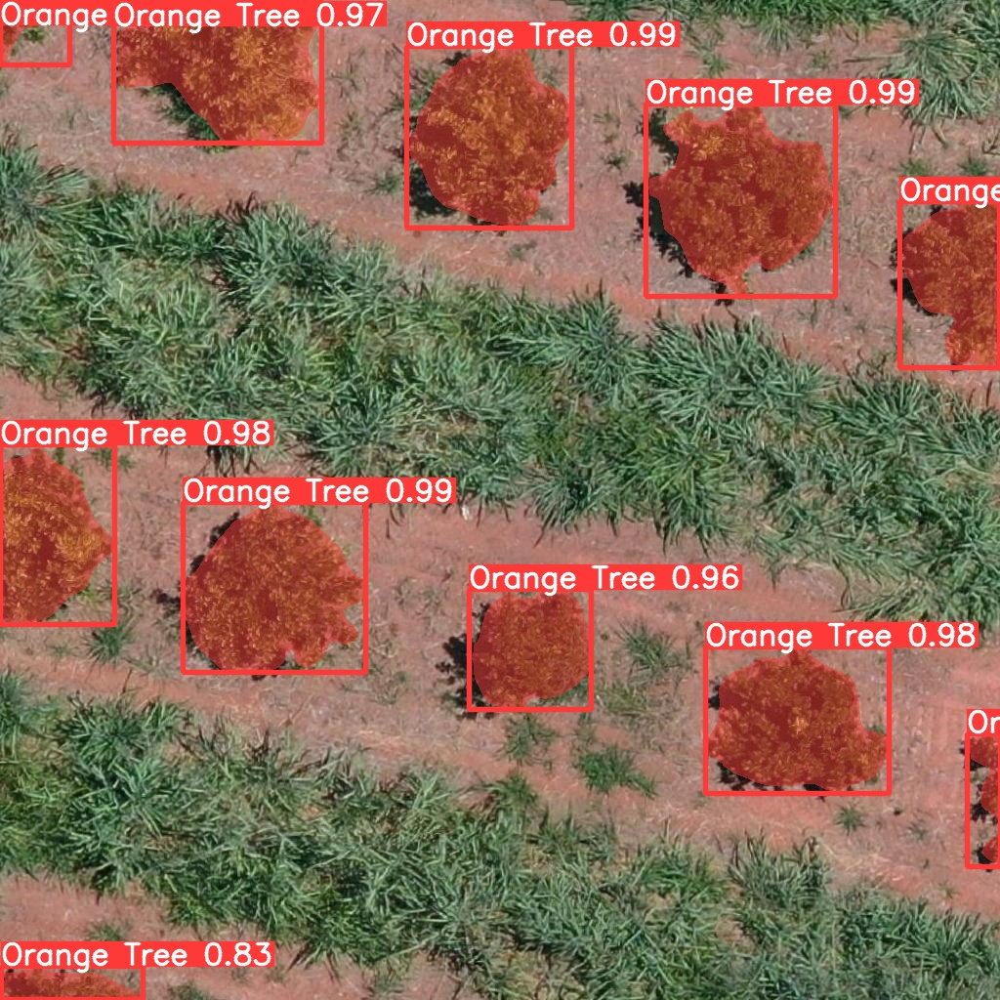

In [ ]:
for image_path in glob.glob(f'{HOME}/runs/segment/predict/*.jpg')[:5]:
      display(Image(filename=image_path, height=600))
      print("\n")

We can also apply the trained model to the entire image. Let's divide the image into several parts and apply the trained model:

In [ ]:
if not os.path.isdir('/content/Predict'):
    os.mkdir('/content/Predict')

In [ ]:
src = rasterio.open(path_img)

In [ ]:
qtd = 0
out_meta = src.meta.copy()
for n in range((src.meta['width']//1024)):
  for m in range((src.meta['height']//1024)):
    x = (n*1024)
    y = (m*1024)
    window = Window(x,y,1024,1024)
    win_transform = src.window_transform(window)
    arr_win = src.read(window=window)
    arr_win = arr_win[0:3,:,:]
    qtd = qtd + 1
    path_exp = '/content/Predict/img_' + str(qtd) + '.tif'
    out_meta.update({"driver": "GTiff","height": 1024,"width": 1024, "transform":win_transform})
    with rasterio.open(path_exp, 'w', **out_meta) as dst:
        for i, layer in enumerate(arr_win, start=1):
            dst.write_band(i, layer.reshape(-1, layer.shape[-1]))
    del arr_win

In [ ]:
if not os.path.isdir('/content/Predict_jpg'):
    os.mkdir('/content/Predict_jpg')

path_data_pred = '/content/Predict_jpg'
imgs_to_pred = os.listdir('/content/Predict')
for images in imgs_to_pred:
  src = rasterio.open('/content/Predict/' + images)
  raster = src.read()
  raster = raster.transpose([1,2,0])
  raster = raster[:,:,0:3]
  imsave(os.path.join(path_data_pred,images.split('.')[0] + '.jpg'), raster)

In [ ]:
!yolo task=segment mode=predict model=/content/runs/segment/train/weights/best.pt conf=0.30 source= /content/Predict_jpg save=true save_txt=true

Ultralytics YOLOv8.1.9 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11779987 parameters, 0 gradients, 42.4 GFLOPs

image 1/60 /content/Predict_jpg/img_1.jpg: 1024x1024 11 Orange Trees, 43.1ms
image 2/60 /content/Predict_jpg/img_10.jpg: 1024x1024 9 Orange Trees, 40.6ms
image 3/60 /content/Predict_jpg/img_11.jpg: 1024x1024 10 Orange Trees, 40.6ms
image 4/60 /content/Predict_jpg/img_12.jpg: 1024x1024 8 Orange Trees, 35.9ms
image 5/60 /content/Predict_jpg/img_13.jpg: 1024x1024 11 Orange Trees, 35.9ms
image 6/60 /content/Predict_jpg/img_14.jpg: 1024x1024 10 Orange Trees, 33.9ms
image 7/60 /content/Predict_jpg/img_15.jpg: 1024x1024 11 Orange Trees, 34.0ms
image 8/60 /content/Predict_jpg/img_16.jpg: 1024x1024 11 Orange Trees, 33.9ms
image 9/60 /content/Predict_jpg/img_17.jpg: 1024x1024 11 Orange Trees, 32.1ms
image 10/60 /content/Predict_jpg/img_18.jpg: 1024x1024 9 Orange Trees, 32.1ms
image 11/60 /content/Predict_jpg/img_19.jpg: 1024

Since we saved a .txt for each image, we can now use them together with the tiff image to obtain the coordinates that form the polygons.

In [ ]:
ls_poly = []
ls_class = []
imgs_to_pred = [f for f in os.listdir('/content/runs/segment/predict2/labels/') if f.endswith('.txt')]
for images in imgs_to_pred:
  filename = images.split('.')[0]
  src = rasterio.open('/content/Predict/' + filename + '.tif')
  path = f'/content/runs/segment/predict2/labels/'+filename+'.txt'
  with open(path, "r") as f:
        txt_file = f.readlines()
        for line in txt_file:
            line_split = line.split()
            cls_idx = line_split[0]
            coords = line_split[1:]
            polygon = np.array([[eval(x), eval(y)] for x, y in zip(coords[0::2], coords[1::2])]) # convert list of coordinates to numpy massive

            polygon[:,0] = polygon[:,0]*1024
            polygon[:,1] = polygon[:,1]*1024

            for i in range(len(polygon)):
              polygon[i,0], polygon[i,1] = rasterio.transform.xy(src.transform, polygon[i,1], polygon[i,0])


            polygon = Polygon(polygon)
            ls_poly.append(polygon)
            ls_class.append(cls_idx)


In [ ]:
ls_poly

[<POLYGON ((621553.034 7741205.096, 621553.019 7741205.081, 621552.975 774120...>,
 <POLYGON ((621556.718 7741203.017, 621556.703 7741203.002, 621556.599 774120...>,
 <POLYGON ((621549.128 7741197.966, 621549.113 7741197.951, 621549.068 774119...>,
 <POLYGON ((621550.227 7741206.582, 621550.212 7741206.567, 621550.167 774120...>,
 <POLYGON ((621544.003 7741200.506, 621543.988 7741200.491, 621543.973 774120...>,
 <POLYGON ((621544.389 7741206.76, 621544.359 7741206.73, 621544.374 7741206....>,
 <POLYGON ((621546.78 7741198.917, 621546.766 7741198.902, 621546.691 7741198...>,
 <POLYGON ((621444.506 7741230.884, 621444.491 7741230.869, 621444.461 774123...>,
 <POLYGON ((621447.982 7741229.74, 621447.967 7741229.725, 621447.952 7741229...>,
 <POLYGON ((621443.882 7741237.182, 621443.867 7741237.168, 621443.837 774123...>,
 <POLYGON ((621451.681 7741228.507, 621451.666 7741228.492, 621451.636 774122...>,
 <POLYGON ((621440.629 7741223.516, 621440.614 7741223.501, 621440.554 774122...>,
 <PO

Finally, we create a GeoDataFrame with the polygons and save it in a .json file.

In [ ]:
gdf = gpd.GeoDataFrame(ls_class, geometry=ls_poly, crs=src.crs)

In [ ]:
gdf.rename(columns={0:'class'}, inplace=True)

In [ ]:
gdf.reset_index(inplace=True)

In [ ]:
gdf

,index,class,geometry
0,0,0,"POLYGON ((621553.034 7741205.096, 621553.019 7..."
1,1,0,"POLYGON ((621556.718 7741203.017, 621556.703 7..."
2,2,0,"POLYGON ((621549.128 7741197.966, 621549.113 7..."
3,3,0,"POLYGON ((621550.227 7741206.582, 621550.212 7..."
4,4,0,"POLYGON ((621544.003 7741200.506, 621543.988 7..."
...,...,...,...
571,571,0,"POLYGON ((621536.635 7741195.827, 621536.620 7..."
572,572,0,"POLYGON ((621534.496 7741197.788, 621534.481 7..."
573,573,0,"POLYGON ((621532.966 7741205.616, 621532.951 7..."
574,574,0,"POLYGON ((621543.245 7741192.544, 621543.230 7..."


In [ ]:
gdf.to_file('orange_trees_pred.json', driver='GeoJSON')

<Axes: >

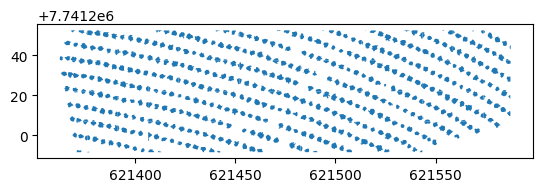

In [ ]:
gdf.plot()